In [2]:
#imported the necessary libraries
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns

import the dataset

In [3]:
student_analysis=pd.read_csv(r"C:\Users\USER\Documents\Students_Grading_Dataset.csv")
student_analysis

,Student_ID,First_Name,Last_Name,Email,Gender,Age,Department,Attendance (%),Midterm_Score,Final_Score,...,Projects_Score,Total_Score,Grade,Study_Hours_per_Week,Extracurricular_Activities,Internet_Access_at_Home,Parent_Education_Level,Family_Income_Level,Stress_Level (1-10),Sleep_Hours_per_Night
0,S1000,Omar,Williams,student0@university.com,Female,22,Engineering,52.29,55.03,57.82,...,85.90,56.09,F,6.2,No,Yes,High School,Medium,5,4.7
1,S1001,Maria,Brown,student1@university.com,Male,18,Engineering,97.27,97.23,45.80,...,55.65,50.64,A,19.0,No,Yes,NaN,Medium,4,9.0
2,S1002,Ahmed,Jones,student2@university.com,Male,24,Business,57.19,67.05,93.68,...,73.79,70.30,D,20.7,No,Yes,Master's,Low,6,6.2
3,S1003,Omar,Williams,student3@university.com,Female,24,Mathematics,95.15,47.79,80.63,...,92.12,61.63,A,24.8,Yes,Yes,High School,High,3,6.7
4,S1004,John,Smith,student4@university.com,Female,23,CS,54.18,46.59,78.89,...,68.42,66.13,F,15.4,Yes,Yes,High School,High,2,7.1
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
4995,S5995,Ahmed,Jones,student4995@university.com,Male,19,Business,NaN,82.15,60.33,...,58.42,85.21,D,25.5,No,Yes,High School,Low,10,8.3
4996,S5996,Emma,Brown,student4996@university.com,Male,19,Business,65.11,86.31,49.80,...,60.87,95.96,C,5.0,No,Yes,NaN,Medium,4,4.0
4997,S5997,John,Brown,student4997@university.com,Female,24,CS,87.54,63.55,64.21,...,82.65,54.25,A,24.8,Yes,No,High School,Medium,4,6.3
4998,S5998,Sara,Davis,student4998@university.com,Male,23,CS,92.56,79.79,94.28,...,94.29,55.84,A,16.1,Yes,Yes,Bachelor's,Low,1,8.4


#### Exploratory data analysis

This is to get insights on our data using visuals.


In [4]:
from ydata_profiling import ProfileReport
profile = ProfileReport(student_analysis)
profile

Summarize dataset:   0%|          | 0/5 [00:00<?, ?it/s]

100%|██████████| 23/23 [00:04<00:00,  5.60it/s]


Generate report structure:   0%|          | 0/1 [00:00<?, ?it/s]

Render HTML:   0%|          | 0/1 [00:00<?, ?it/s]

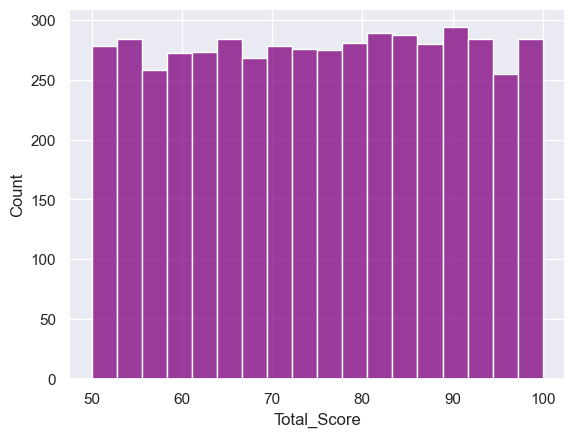

In [18]:
%matplotlib inline
sns.set()
sns.histplot(student_analysis['Total_Score'],color='purple')
plt.show()

#### Data Preprocessing

###### Handling missing values

In [ ]:
#get the information on the dataset so we know what needs to be handled
print(student_analysis.info())

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 5000 entries, 0 to 4999
Data columns (total 23 columns):
 #   Column                      Non-Null Count  Dtype  
---  ------                      --------------  -----  
 0   Student_ID                  5000 non-null   object 
 1   First_Name                  5000 non-null   object 
 2   Last_Name                   5000 non-null   object 
 3   Email                       5000 non-null   object 
 4   Gender                      5000 non-null   object 
 5   Age                         5000 non-null   int64  
 6   Department                  5000 non-null   object 
 7   Attendance (%)              4484 non-null   float64
 8   Midterm_Score               5000 non-null   float64
 9   Final_Score                 5000 non-null   float64
 10  Assignments_Avg             4483 non-null   float64
 11  Quizzes_Avg                 5000 non-null   float64
 12  Participation_Score         5000 non-null   float64
 13  Projects_Score              5000 

In [6]:
#check for columns with null values
print(student_analysis.isnull().sum())

Student_ID                       0
First_Name                       0
Last_Name                        0
Email                            0
Gender                           0
Age                              0
Department                       0
Attendance (%)                 516
Midterm_Score                    0
Final_Score                      0
Assignments_Avg                517
Quizzes_Avg                      0
Participation_Score              0
Projects_Score                   0
Total_Score                      0
Grade                            0
Study_Hours_per_Week             0
Extracurricular_Activities       0
Internet_Access_at_Home          0
Parent_Education_Level        1794
Family_Income_Level              0
Stress_Level (1-10)              0
Sleep_Hours_per_Night            0
dtype: int64


In [7]:
#drop unnecessary columns
student_analysis.drop(columns=['Student_ID','Email'], inplace= True)

In [8]:
student_analysis.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 5000 entries, 0 to 4999
Data columns (total 21 columns):
 #   Column                      Non-Null Count  Dtype  
---  ------                      --------------  -----  
 0   First_Name                  5000 non-null   object 
 1   Last_Name                   5000 non-null   object 
 2   Gender                      5000 non-null   object 
 3   Age                         5000 non-null   int64  
 4   Department                  5000 non-null   object 
 5   Attendance (%)              4484 non-null   float64
 6   Midterm_Score               5000 non-null   float64
 7   Final_Score                 5000 non-null   float64
 8   Assignments_Avg             4483 non-null   float64
 9   Quizzes_Avg                 5000 non-null   float64
 10  Participation_Score         5000 non-null   float64
 11  Projects_Score              5000 non-null   float64
 12  Total_Score                 5000 non-null   float64
 13  Grade                       5000 

In [9]:
student_analysis['Attendance (%)'] = student_analysis['Attendance (%)'].fillna(student_analysis['Attendance (%)'].mean())
student_analysis

,First_Name,Last_Name,Gender,Age,Department,Attendance (%),Midterm_Score,Final_Score,Assignments_Avg,Quizzes_Avg,...,Projects_Score,Total_Score,Grade,Study_Hours_per_Week,Extracurricular_Activities,Internet_Access_at_Home,Parent_Education_Level,Family_Income_Level,Stress_Level (1-10),Sleep_Hours_per_Night
0,Omar,Williams,Female,22,Engineering,52.290000,55.03,57.82,84.22,74.06,...,85.90,56.09,F,6.2,No,Yes,High School,Medium,5,4.7
1,Maria,Brown,Male,18,Engineering,97.270000,97.23,45.80,NaN,94.24,...,55.65,50.64,A,19.0,No,Yes,NaN,Medium,4,9.0
2,Ahmed,Jones,Male,24,Business,57.190000,67.05,93.68,67.70,85.70,...,73.79,70.30,D,20.7,No,Yes,Master's,Low,6,6.2
3,Omar,Williams,Female,24,Mathematics,95.150000,47.79,80.63,66.06,93.51,...,92.12,61.63,A,24.8,Yes,Yes,High School,High,3,6.7
4,John,Smith,Female,23,CS,54.180000,46.59,78.89,96.85,83.70,...,68.42,66.13,F,15.4,Yes,Yes,High School,High,2,7.1
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
4995,Ahmed,Jones,Male,19,Business,75.431409,82.15,60.33,80.09,99.32,...,58.42,85.21,D,25.5,No,Yes,High School,Low,10,8.3
4996,Emma,Brown,Male,19,Business,65.110000,86.31,49.80,NaN,88.08,...,60.87,95.96,C,5.0,No,Yes,NaN,Medium,4,4.0
4997,John,Brown,Female,24,CS,87.540000,63.55,64.21,94.28,50.19,...,82.65,54.25,A,24.8,Yes,No,High School,Medium,4,6.3
4998,Sara,Davis,Male,23,CS,92.560000,79.79,94.28,81.20,61.18,...,94.29,55.84,A,16.1,Yes,Yes,Bachelor's,Low,1,8.4


In [10]:
student_analysis['Assignments_Avg'] = student_analysis['Assignments_Avg'].fillna(student_analysis['Assignments_Avg'].mean())
student_analysis

,First_Name,Last_Name,Gender,Age,Department,Attendance (%),Midterm_Score,Final_Score,Assignments_Avg,Quizzes_Avg,...,Projects_Score,Total_Score,Grade,Study_Hours_per_Week,Extracurricular_Activities,Internet_Access_at_Home,Parent_Education_Level,Family_Income_Level,Stress_Level (1-10),Sleep_Hours_per_Night
0,Omar,Williams,Female,22,Engineering,52.290000,55.03,57.82,84.220000,74.06,...,85.90,56.09,F,6.2,No,Yes,High School,Medium,5,4.7
1,Maria,Brown,Male,18,Engineering,97.270000,97.23,45.80,74.798673,94.24,...,55.65,50.64,A,19.0,No,Yes,NaN,Medium,4,9.0
2,Ahmed,Jones,Male,24,Business,57.190000,67.05,93.68,67.700000,85.70,...,73.79,70.30,D,20.7,No,Yes,Master's,Low,6,6.2
3,Omar,Williams,Female,24,Mathematics,95.150000,47.79,80.63,66.060000,93.51,...,92.12,61.63,A,24.8,Yes,Yes,High School,High,3,6.7
4,John,Smith,Female,23,CS,54.180000,46.59,78.89,96.850000,83.70,...,68.42,66.13,F,15.4,Yes,Yes,High School,High,2,7.1
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
4995,Ahmed,Jones,Male,19,Business,75.431409,82.15,60.33,80.090000,99.32,...,58.42,85.21,D,25.5,No,Yes,High School,Low,10,8.3
4996,Emma,Brown,Male,19,Business,65.110000,86.31,49.80,74.798673,88.08,...,60.87,95.96,C,5.0,No,Yes,NaN,Medium,4,4.0
4997,John,Brown,Female,24,CS,87.540000,63.55,64.21,94.280000,50.19,...,82.65,54.25,A,24.8,Yes,No,High School,Medium,4,6.3
4998,Sara,Davis,Male,23,CS,92.560000,79.79,94.28,81.200000,61.18,...,94.29,55.84,A,16.1,Yes,Yes,Bachelor's,Low,1,8.4


In [11]:
student_analysis['Parent_Education_Level'] = student_analysis['Parent_Education_Level'].fillna('Unknown')
student_analysis

,First_Name,Last_Name,Gender,Age,Department,Attendance (%),Midterm_Score,Final_Score,Assignments_Avg,Quizzes_Avg,...,Projects_Score,Total_Score,Grade,Study_Hours_per_Week,Extracurricular_Activities,Internet_Access_at_Home,Parent_Education_Level,Family_Income_Level,Stress_Level (1-10),Sleep_Hours_per_Night
0,Omar,Williams,Female,22,Engineering,52.290000,55.03,57.82,84.220000,74.06,...,85.90,56.09,F,6.2,No,Yes,High School,Medium,5,4.7
1,Maria,Brown,Male,18,Engineering,97.270000,97.23,45.80,74.798673,94.24,...,55.65,50.64,A,19.0,No,Yes,Unknown,Medium,4,9.0
2,Ahmed,Jones,Male,24,Business,57.190000,67.05,93.68,67.700000,85.70,...,73.79,70.30,D,20.7,No,Yes,Master's,Low,6,6.2
3,Omar,Williams,Female,24,Mathematics,95.150000,47.79,80.63,66.060000,93.51,...,92.12,61.63,A,24.8,Yes,Yes,High School,High,3,6.7
4,John,Smith,Female,23,CS,54.180000,46.59,78.89,96.850000,83.70,...,68.42,66.13,F,15.4,Yes,Yes,High School,High,2,7.1
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
4995,Ahmed,Jones,Male,19,Business,75.431409,82.15,60.33,80.090000,99.32,...,58.42,85.21,D,25.5,No,Yes,High School,Low,10,8.3
4996,Emma,Brown,Male,19,Business,65.110000,86.31,49.80,74.798673,88.08,...,60.87,95.96,C,5.0,No,Yes,Unknown,Medium,4,4.0
4997,John,Brown,Female,24,CS,87.540000,63.55,64.21,94.280000,50.19,...,82.65,54.25,A,24.8,Yes,No,High School,Medium,4,6.3
4998,Sara,Davis,Male,23,CS,92.560000,79.79,94.28,81.200000,61.18,...,94.29,55.84,A,16.1,Yes,Yes,Bachelor's,Low,1,8.4


In [12]:
student_analysis.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 5000 entries, 0 to 4999
Data columns (total 21 columns):
 #   Column                      Non-Null Count  Dtype  
---  ------                      --------------  -----  
 0   First_Name                  5000 non-null   object 
 1   Last_Name                   5000 non-null   object 
 2   Gender                      5000 non-null   object 
 3   Age                         5000 non-null   int64  
 4   Department                  5000 non-null   object 
 5   Attendance (%)              5000 non-null   float64
 6   Midterm_Score               5000 non-null   float64
 7   Final_Score                 5000 non-null   float64
 8   Assignments_Avg             5000 non-null   float64
 9   Quizzes_Avg                 5000 non-null   float64
 10  Participation_Score         5000 non-null   float64
 11  Projects_Score              5000 non-null   float64
 12  Total_Score                 5000 non-null   float64
 13  Grade                       5000 

###### checking each column to make sure they have the correct datatype

In [13]:
#checking each column to make sure they have the correct datatype

student_analysis.dtypes

First_Name                     object
Last_Name                      object
Gender                         object
Age                             int64
Department                     object
Attendance (%)                float64
Midterm_Score                 float64
Final_Score                   float64
Assignments_Avg               float64
Quizzes_Avg                   float64
Participation_Score           float64
Projects_Score                float64
Total_Score                   float64
Grade                          object
Study_Hours_per_Week          float64
Extracurricular_Activities     object
Internet_Access_at_Home        object
Parent_Education_Level         object
Family_Income_Level            object
Stress_Level (1-10)             int64
Sleep_Hours_per_Night         float64
dtype: object

###### convert the string columns into categories

In [15]:
#convert the string columns into categories

categorical_columns = [
    'Gender',
    'Department',
    'Grade',
    'Extracurricular_Activities',
    'Internet_Access_at_Home',
    'Parent_Education_Level',
    'Family_Income_Level'
]

for col in categorical_columns:
    student_analysis[col] = student_analysis[col].astype('category')

student_analysis

,First_Name,Last_Name,Gender,Age,Department,Attendance (%),Midterm_Score,Final_Score,Assignments_Avg,Quizzes_Avg,...,Projects_Score,Total_Score,Grade,Study_Hours_per_Week,Extracurricular_Activities,Internet_Access_at_Home,Parent_Education_Level,Family_Income_Level,Stress_Level (1-10),Sleep_Hours_per_Night
0,Omar,Williams,Female,22,Engineering,52.290000,55.03,57.82,84.220000,74.06,...,85.90,56.09,F,6.2,No,Yes,High School,Medium,5,4.7
1,Maria,Brown,Male,18,Engineering,97.270000,97.23,45.80,74.798673,94.24,...,55.65,50.64,A,19.0,No,Yes,Unknown,Medium,4,9.0
2,Ahmed,Jones,Male,24,Business,57.190000,67.05,93.68,67.700000,85.70,...,73.79,70.30,D,20.7,No,Yes,Master's,Low,6,6.2
3,Omar,Williams,Female,24,Mathematics,95.150000,47.79,80.63,66.060000,93.51,...,92.12,61.63,A,24.8,Yes,Yes,High School,High,3,6.7
4,John,Smith,Female,23,CS,54.180000,46.59,78.89,96.850000,83.70,...,68.42,66.13,F,15.4,Yes,Yes,High School,High,2,7.1
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
4995,Ahmed,Jones,Male,19,Business,75.431409,82.15,60.33,80.090000,99.32,...,58.42,85.21,D,25.5,No,Yes,High School,Low,10,8.3
4996,Emma,Brown,Male,19,Business,65.110000,86.31,49.80,74.798673,88.08,...,60.87,95.96,C,5.0,No,Yes,Unknown,Medium,4,4.0
4997,John,Brown,Female,24,CS,87.540000,63.55,64.21,94.280000,50.19,...,82.65,54.25,A,24.8,Yes,No,High School,Medium,4,6.3
4998,Sara,Davis,Male,23,CS,92.560000,79.79,94.28,81.200000,61.18,...,94.29,55.84,A,16.1,Yes,Yes,Bachelor's,Low,1,8.4


In [16]:
student_analysis['Gender'].dtype

CategoricalDtype(categories=['Female', 'Male'], ordered=False, categories_dtype=object)

In [19]:
student_analysis.dtypes

First_Name                      object
Last_Name                       object
Gender                        category
Age                              int64
Department                    category
Attendance (%)                 float64
Midterm_Score                  float64
Final_Score                    float64
Assignments_Avg                float64
Quizzes_Avg                    float64
Participation_Score            float64
Projects_Score                 float64
Total_Score                    float64
Grade                         category
Study_Hours_per_Week           float64
Extracurricular_Activities    category
Internet_Access_at_Home       category
Parent_Education_Level        category
Family_Income_Level           category
Stress_Level (1-10)              int64
Sleep_Hours_per_Night          float64
dtype: object

###### Splitting the dataset into labels and features

In [29]:
X = student_analysis.drop(['Total_Score','First_Name', 'Last_Name','Midterm_Score','Final_Score','Assignments_Avg','Quizzes_Avg','Participation_Score','Projects_Score'], axis= "columns")
y = student_analysis["Total_Score"]

In [30]:
X.head()

,Gender,Age,Department,Attendance (%),Grade,Study_Hours_per_Week,Extracurricular_Activities,Internet_Access_at_Home,Parent_Education_Level,Family_Income_Level,Stress_Level (1-10),Sleep_Hours_per_Night
0,Female,22,Engineering,52.29,F,6.2,No,Yes,High School,Medium,5,4.7
1,Male,18,Engineering,97.27,A,19.0,No,Yes,Unknown,Medium,4,9.0
2,Male,24,Business,57.19,D,20.7,No,Yes,Master's,Low,6,6.2
3,Female,24,Mathematics,95.15,A,24.8,Yes,Yes,High School,High,3,6.7
4,Female,23,CS,54.18,F,15.4,Yes,Yes,High School,High,2,7.1


In [25]:
print(y.head())

0    56.09
1    50.64
2    70.30
3    61.63
4    66.13
Name: Total_Score, dtype: float64


In [33]:
X= pd.get_dummies(X)
X

,Age,Attendance (%),Study_Hours_per_Week,Stress_Level (1-10),Sleep_Hours_per_Night,Gender_Female,Gender_Male,Department_Business,Department_CS,Department_Engineering,...,Internet_Access_at_Home_No,Internet_Access_at_Home_Yes,Parent_Education_Level_Bachelor's,Parent_Education_Level_High School,Parent_Education_Level_Master's,Parent_Education_Level_PhD,Parent_Education_Level_Unknown,Family_Income_Level_High,Family_Income_Level_Low,Family_Income_Level_Medium
0,22,52.290000,6.2,5,4.7,True,False,False,False,True,...,False,True,False,True,False,False,False,False,False,True
1,18,97.270000,19.0,4,9.0,False,True,False,False,True,...,False,True,False,False,False,False,True,False,False,True
2,24,57.190000,20.7,6,6.2,False,True,True,False,False,...,False,True,False,False,True,False,False,False,True,False
3,24,95.150000,24.8,3,6.7,True,False,False,False,False,...,False,True,False,True,False,False,False,True,False,False
4,23,54.180000,15.4,2,7.1,True,False,False,True,False,...,False,True,False,True,False,False,False,True,False,False
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
4995,19,75.431409,25.5,10,8.3,False,True,True,False,False,...,False,True,False,True,False,False,False,False,True,False
4996,19,65.110000,5.0,4,4.0,False,True,True,False,False,...,False,True,False,False,False,False,True,False,False,True
4997,24,87.540000,24.8,4,6.3,True,False,False,True,False,...,True,False,False,True,False,False,False,False,False,True
4998,23,92.560000,16.1,1,8.4,False,True,False,True,False,...,False,True,True,False,False,False,False,False,True,False


In [38]:
from sklearn.model_selection import train_test_split

X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, train_size=0.8, random_state=42) 

In [39]:
X_test


,Age,Attendance (%),Study_Hours_per_Week,Stress_Level (1-10),Sleep_Hours_per_Night,Gender_Female,Gender_Male,Department_Business,Department_CS,Department_Engineering,...,Internet_Access_at_Home_No,Internet_Access_at_Home_Yes,Parent_Education_Level_Bachelor's,Parent_Education_Level_High School,Parent_Education_Level_Master's,Parent_Education_Level_PhD,Parent_Education_Level_Unknown,Family_Income_Level_High,Family_Income_Level_Low,Family_Income_Level_Medium
1501,23,96.54,20.8,3,7.3,False,True,False,False,False,...,False,True,False,False,False,False,True,True,False,False
2586,18,81.01,22.7,10,8.3,False,True,True,False,False,...,False,True,False,False,True,False,False,True,False,False
2653,21,99.54,7.4,8,4.7,False,True,False,True,False,...,False,True,False,False,False,False,True,False,False,True
1055,22,61.08,16.9,9,6.4,False,True,False,True,False,...,False,True,False,True,False,False,False,False,True,False
705,22,89.77,15.4,2,4.0,True,False,False,True,False,...,False,True,False,True,False,False,False,False,True,False
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
4711,22,55.25,25.9,1,4.3,True,False,False,True,False,...,False,True,True,False,False,False,False,True,False,False
2313,24,94.72,24.3,6,5.8,False,True,True,False,False,...,True,False,False,False,False,False,True,False,False,True
3214,20,85.51,18.9,6,7.7,False,True,False,False,True,...,True,False,False,False,True,False,False,False,True,False
2732,18,71.46,21.2,6,6.6,True,False,False,True,False,...,False,True,False,False,False,False,True,False,False,True


In [40]:
X_train

,Age,Attendance (%),Study_Hours_per_Week,Stress_Level (1-10),Sleep_Hours_per_Night,Gender_Female,Gender_Male,Department_Business,Department_CS,Department_Engineering,...,Internet_Access_at_Home_No,Internet_Access_at_Home_Yes,Parent_Education_Level_Bachelor's,Parent_Education_Level_High School,Parent_Education_Level_Master's,Parent_Education_Level_PhD,Parent_Education_Level_Unknown,Family_Income_Level_High,Family_Income_Level_Low,Family_Income_Level_Medium
4227,23,98.44,9.6,2,6.9,False,True,False,True,False,...,False,True,False,False,False,False,True,False,True,False
4676,23,91.52,12.3,1,4.1,False,True,False,True,False,...,False,True,False,False,False,False,True,False,False,True
800,24,89.47,23.5,2,6.1,True,False,False,False,True,...,False,True,False,False,True,False,False,False,True,False
3671,18,87.23,6.6,8,4.8,True,False,False,True,False,...,False,True,False,False,False,False,True,False,False,True
4193,24,97.41,5.0,10,5.0,True,False,False,False,True,...,True,False,True,False,False,False,False,False,False,True
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
4426,18,81.02,17.6,10,4.9,True,False,False,True,False,...,False,True,False,False,False,True,False,False,False,True
466,18,85.88,17.2,9,8.9,True,False,False,True,False,...,False,True,False,False,False,True,False,False,True,False
3092,19,50.28,15.0,3,5.6,True,False,False,True,False,...,False,True,True,False,False,False,False,False,False,True
3772,23,52.34,18.8,3,6.8,True,False,False,True,False,...,True,False,False,False,False,False,True,False,False,True


#### Model Building

###### We will be using the following models for the prediction:


- Linear regression 

- Random forest model 

- Extreme gradient boost(XGboost)

- Support vector machine

- Decision tree

- Ridge regression

- K nearest neighbour

- Gradient boost classifier